# **<font color="#ffb94f">0.0 SETUP</font>**

In [ ]:
# In case of running on Google Colab
%%capture

# !apt-get install -qq curl g++ make
# !curl -L http://download.osgeo.org/libspatialindex/spatialindex-src-1.8.5.tar.gz | tar xz
# import os
# os.chdir('spatialindex-src-1.8.5')|
# !./configure
# !make
# !make install
# !pip install rtree
# !ldconfig
# !pip install scikit-mobility

In [ ]:
%%capture
# Importing libraries
import numpy as np
import random
import pandas as pd
import datetime
import collections
from sklearn.impute import SimpleImputer

# Data visualization
import matplotlib.pyplot as plt
import matplotlib.patches
import matplotlib.ticker as ticker
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns

# Geospatial analysis
!pip install geovoronoi
!pip install geopandas
!pip install folium
import geopandas as gpd
import folium
import json
from scipy.stats import gaussian_kde, iqr
from scipy.spatial import Voronoi, voronoi_plot_2d
from geovoronoi import voronoi_regions_from_coords, points_to_coords
from shapely.geometry import MultiPolygon, Polygon, Point
from shapely.ops import unary_union

# Outlier Detection
from sklearn.cluster import DBSCAN
from sklearn.neighbors import LocalOutlierFactor, NearestNeighbors
from sklearn.ensemble import IsolationForest

# Dimensionality Reduction
from sklearn.feature_selection import VarianceThreshold, SelectKBest, SelectFromModel, chi2
from sklearn.decomposition import PCA

# Regression
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso
from sklearn.ensemble import GradientBoostingRegressor

# Time Series Analysis
from scipy.spatial.distance import euclidean


# import skmob
# from skmob.tessellation import tilers
# from skmob.models.epr import DensityEPR, SpatialEPR, Ditras
# from skmob.models.markov_diary_generator import MarkovDiaryGenerator
# from skmob.preprocessing import filtering, compression, detection, clustering
# from skmob.measures.individual import jump_lengths, radius_of_gyration, uncorrelated_entropy, number_of_locations, number_of_visits, location_frequency
# from skmob.measures.collective import visits_per_location
# from skmob.utils.plot import *
# from skmob.data.load import load_dataset, list_datasets

# import sklearn
# from sklearn.metrics import mean_squared_error

In [ ]:
# Setting up plot style
sns.set_context(font_scale=2, rc={"font.size":10,"axes.titlesize":16,"axes.labelsize":14})
sns.set_style("whitegrid", {'grid.linestyle': '--', 'alpha': 0.25})
sns.set_style({'font.family':'serif', 'font.serif':'Computer Modern'})

# **<font color="#ffb94f">1.0 DATA UNDERSTANDING & PREPARATION</font>**

## **<font color="#84f745">1.1 DATA UNDERSTANDING</font>**

In [ ]:
# Taking a first look at the dataset
air_quality_index = 'https://raw.githubusercontent.com/Bruno-Limon/air-quality-analysis/main/AQI-2016.csv'
df_aqi = pd.read_csv(air_quality_index)

display(pd.concat([df_aqi.head(2), df_aqi.tail(2)])) 

,Fecha,Hora,CO,NO2,O3,PM 10,SO2,PM2.5,Temperatura,Humedad relativa,Velocidad de viento,Direccion de vientos,Radiacion solar,Indice UV,CASETA
0,01/01/2016,0:00:00,1.471,0.02763,0.00472,146.95,0.00306,NaN,18.3,70.3,2.2,270.3,NaN,NaN,ATM
1,01/01/2016,1:00:00,2.653,0.02632,0.00335,216.10,0.00322,NaN,17.3,74.2,0.4,219.5,NaN,NaN,ATM
87838,31/12/2016,22:00:00,1.690,0.03112,0.00712,NaN,NaN,NaN,20.5,52.8,2.4,NaN,NaN,NaN,MIR
87839,31/12/2016,23:00:00,1.510,0.02767,0.00748,NaN,NaN,NaN,19.7,56.7,3.4,NaN,NaN,NaN,MIR


In [ ]:
df_aqi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87840 entries, 0 to 87839
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Fecha                  87840 non-null  object 
 1   Hora                   87840 non-null  object 
 2   CO                     77138 non-null  float64
 3   NO2                    78519 non-null  float64
 4   O3                     78647 non-null  float64
 5   PM 10                  45142 non-null  float64
 6   SO2                    57942 non-null  float64
 7   PM2.5                  7459 non-null   float64
 8   Temperatura            69318 non-null  float64
 9   Humedad relativa       78099 non-null  float64
 10  Velocidad de viento    86852 non-null  float64
 11  Direccion de vientos   78410 non-null  float64
 12  Radiacion solar        26295 non-null  float64
 13  Indice UV              8784 non-null   float64
 14  CASETA                 87840 non-null  object 
dtypes:

In [ ]:
# Creating datetime column using date and hour columns
df_aqi.insert(0, 'Datetime', pd.to_datetime(df_aqi['Fecha'] + ' ' + df_aqi['Hora']))
df_aqi.drop(['Fecha', 'Hora'], axis = 1, inplace = True)

# Looking at unique values and time span
print('Distinct monitoring stations:', df_aqi['CASETA '].unique())
print('Earliest date:', df_aqi['Datetime'].min())
print('Latest date:', df_aqi['Datetime'].max())

Distinct monitoring stations: ['ATM' 'OBL' 'PIN' 'SFE' 'TLA' 'VAL' 'CEN' 'AGU' 'LDO' 'MIR']
Earliest date: 2016-01-01 00:00:00
Latest date: 2016-12-31 23:00:00


In [ ]:
# Mapping the 3 letter code of monitoring stations to their full name, for clarity
dict_caseta = {'ATM': 'Atemajac',
               'OBL': 'Oblatos', 
               'PIN': 'Las Pintas', 
               'SFE': 'Santa Fe', 
               'TLA': 'Tlaquepaque', 
               'VAL': 'Vallarta', 
               'CEN': 'Centro',
               'AGU': 'Las Aguilas',
               'LDO': 'Loma Dorada',
               'MIR': 'Miravalle',}

df_aqi["Caseta"] = df_aqi['CASETA '].map(dict_caseta)
df_aqi.drop(['CASETA '], axis = 1, inplace = True)

MISSING DATA

In [ ]:
# Looking at the amount of null values across features
print(df_aqi.isnull().sum(axis = 0))

# Dropping unncessary features or those with over 50% missing values
to_drop = ['PM2.5 ', 'Radiacion solar', 'Indice UV', 'Direccion de vientos ']
df_aqi.drop(to_drop, axis = 1, inplace = True)
df_aqi.rename(columns = {'Humedad relativa ':'Humidity', 
                         'Velocidad de viento ':'Wind velocity',
                         'Caseta':'Station',
                         'Temperatura':'Temperature'}, inplace = True)

Datetime                     0
CO                       10702
NO2                       9321
O3                        9193
PM 10                    42698
SO2                      29898
PM2.5                    80381
Temperatura              18522
Humedad relativa          9741
Velocidad de viento        988
Direccion de vientos      9430
Radiacion solar          61545
Indice UV                79056
Caseta                       0
dtype: int64


In [ ]:
list_monitor_station = list(df_aqi['Station'].unique())
list_columns = list(df_aqi.columns.values)[1:9]

# Creating list containing null values filtered by the monitoring station
list_nulls = []
for i, station in enumerate(list_monitor_station):
    list_nulls.append([])
    for j in range(len(list_columns)):
        list_nulls[i].append(df_aqi.loc[df_aqi['Station'] == station].iloc[:,j+1].isnull().sum())

# Putting the lists into a dataframe
df_aqi_nulls = pd.DataFrame(np.column_stack([list_nulls[i] for i in range(len(list_monitor_station))]),
                            columns = list_monitor_station,
                            index = list_columns)
df_aqi_nulls.T

,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
Atemajac,605,604,929,5241,671,73,73,73
Oblatos,457,553,533,5032,566,16,16,16
Las Pintas,1479,1002,936,3341,7838,6,6,6
Santa Fe,1077,986,1381,1305,6486,8784,8784,31
Tlaquepaque,489,475,646,4911,477,70,70,70
Vallarta,1176,554,412,4901,2555,20,20,20
Centro,3024,391,640,4977,1142,8784,3,3
Las Aguilas,372,1507,358,5140,3955,5,5,5
Loma Dorada,310,922,1071,1166,2844,422,422,422
Miravalle,1713,2327,2287,6684,3364,342,342,342


As seen from the previous dataframe, some monitoring stations must have had some sensors not functioning thruoughout the year, such as temperature and humidity in the "Santa Fe" station, since every value concerning them is missing.

This might make these stations useless for some of the analysis and algorithms applied to the data

In [ ]:
%%capture 
# Dealing with missing values with different methods, imputing with mean, median, forward filling and dropping them altogether
df_aqi_dropna = df_aqi.dropna()
df_aqi_imputed1 = df_aqi.fillna(df_aqi.mean())
df_aqi_imputed2 = df_aqi.fillna(df_aqi.median())
df_aqi_imputed3 = df_aqi.fillna(method = "ffill")

list_values_dropna = [df_aqi_dropna.iloc[:,i].values for i in range(1,9)]
list_imputed_values1 = [df_aqi_imputed1.iloc[:,i].values for i in range(1,9)]
list_imputed_values2 = [df_aqi_imputed2.iloc[:,i].values for i in range(1,9)]
list_imputed_values3 = [df_aqi_imputed3.iloc[:,i].values for i in range(1,9)]

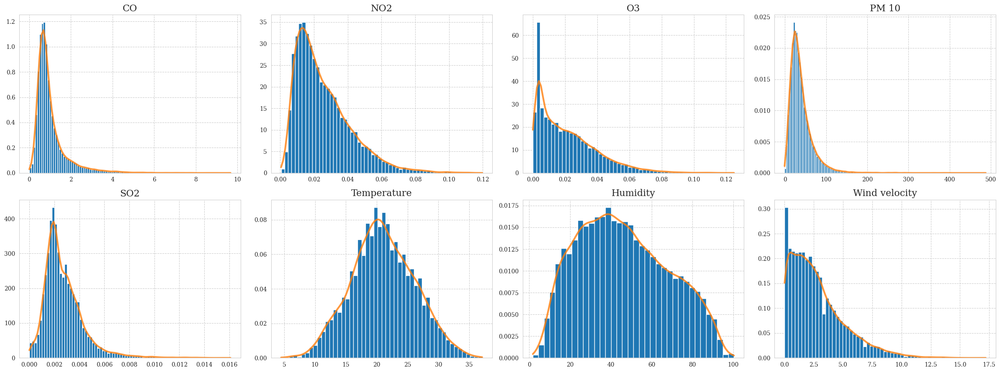

In [ ]:
# Obtaining distribution of each feature using KDE method
list_x = []
list_y = []
list_x1 = []
list_y1 = []
list_x2 = []
list_y2 = []
list_x3 = []
list_y3 = []

for i in range(len(list_values_dropna)):
    kde = gaussian_kde(list_values_dropna[i])
    x = np.linspace(min(list_values_dropna[i]), max(list_values_dropna[i]), 100)
    list_x.append(x)
    list_y.append(kde(x))

    kde1 = gaussian_kde(list_imputed_values1[i])
    x1 = np.linspace(min(list_imputed_values1[i]), max(list_imputed_values1[i]), 100)
    list_x1.append(x1)
    list_y1.append(kde1(x1))

    kde2 = gaussian_kde(list_imputed_values2[i])
    x2 = np.linspace(min(list_imputed_values2[i]), max(list_imputed_values2[i]), 100)
    list_x2.append(x2)
    list_y2.append(kde2(x2))

    kde3 = gaussian_kde(list_imputed_values3[i])
    x3 = np.linspace(min(list_imputed_values3[i]), max(list_imputed_values3[i]), 100)
    list_x3.append(x3)
    list_y3.append(kde3(x3))

# Plotting histogram for each feature in dataset
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].hist(list_values_dropna[k], bins = 'scott', density = True)
        ax[i,j].plot(list_x[k], list_y[k], linewidth = 3, alpha = .8)
        ax[i,j].set(title = list_columns[k])
        fig.tight_layout()
        k += 1

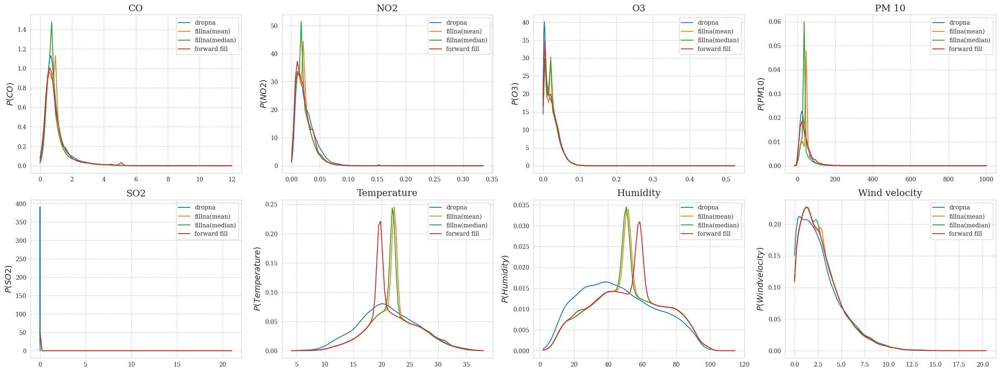

In [ ]:
# Plotting distributions
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].plot(list_x[k], list_y[k], label = 'dropna')
        ax[i,j].plot(list_x1[k], list_y1[k], label = 'fillna(mean)')
        ax[i,j].plot(list_x2[k], list_y2[k], label = 'fillna(median)')
        ax[i,j].plot(list_x3[k], list_y3[k], label = 'forward fill')
        ax[i,j].legend(loc = 'best')
        ax[i,j].set(title = list_columns[k])
        ax[i,j].set(ylabel = "$P({})$".format(list_columns[k]))
        fig.tight_layout()
        k += 1

Looking at the comparison of different methods to deal with missing values, forward filling seems to be closer to the distribution of the values omitting NA, such is the case for the 1st 4 features for example, then, when looking at temperature and humidity, we get confirmation of the undesirable effects that imputing a large amount of values can heavily bias the distribution, by adding synthetic density into the mean areas of the distribution

Another interesting thing to note is that the distribution of SO2 went from a range of 0-0.016 when omitting nan values to 0-20 when imputing said values, given the orders of magnitude of this change, it might prove to be an anomaly

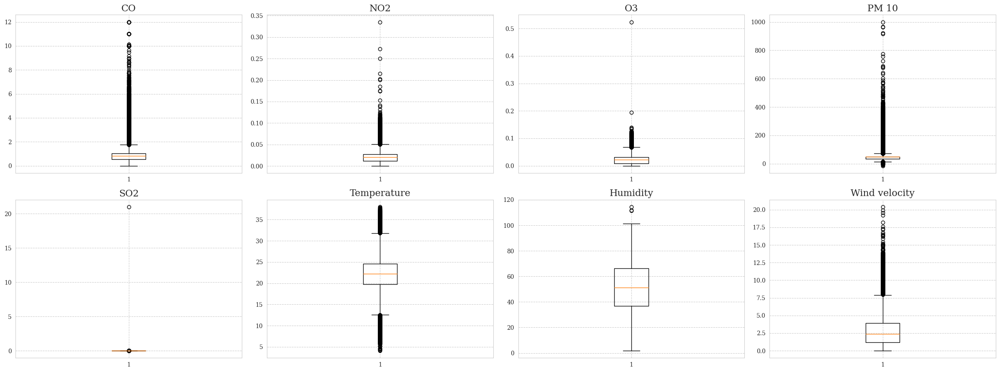

In [ ]:
# Plotting histogram for each feature in dataset of values imputed with the mean to look deeper into the SO2 anomaly
fig, ax = plt.subplots(nrows = 2, ncols = 4, figsize = (24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].boxplot(list_imputed_values1[k])
        ax[i,j].set(title = list_columns[k])
        fig.tight_layout()
        k += 1

In [ ]:
# Intuition was correct, SO2 contains a single outlier that completely skews the distribution
# To get a confirmation, we look at the 5 largest values of SO2
print('Top 5 SO2 values\n', df_aqi['SO2'].nlargest(5), '\n', sep="")
print('Top 5 O3 values\n', df_aqi['O3'].nlargest(5), sep="")

Top 5 SO2 values
43816    21.00000
19798     0.02722
27165     0.02147
26864     0.01973
79988     0.01933
Name: SO2, dtype: float64

Top 5 O3 values
14554    0.52392
54498    0.19370
56560    0.13908
21422    0.13695
56559    0.13385
Name: O3, dtype: float64


In [ ]:
%%capture
# Removing the monitoring stations with features consisting entirely of missing values as well as the anomaly in SO2
df_aqi_clean = df_aqi[df_aqi.Station.str.contains('Santa Fe|Centro') == False]
df_aqi_clean = df_aqi_clean.drop([43816, 14554])

# Re-imputing the values with the new clean dataset
df_aqi_clean_dropna = df_aqi_clean.dropna()
df_aqi_clean_imputed1 = df_aqi_clean.fillna(df_aqi_clean.mean())
df_aqi_clean_imputed2 = df_aqi_clean.fillna(df_aqi_clean.median())
df_aqi_clean_imputed3 = df_aqi_clean.fillna(method = "ffill")

list_clean_values_dropna = [df_aqi_clean_dropna.iloc[:,i].values for i in range(1,9)]
list_clean_imputed_values1 = [df_aqi_clean_imputed1.iloc[:,i].values for i in range(1,9)]
list_clean_imputed_values2 = [df_aqi_clean_imputed2.iloc[:,i].values for i in range(1,9)]
list_clean_imputed_values3 = [df_aqi_clean_imputed3.iloc[:,i].values for i in range(1,9)]

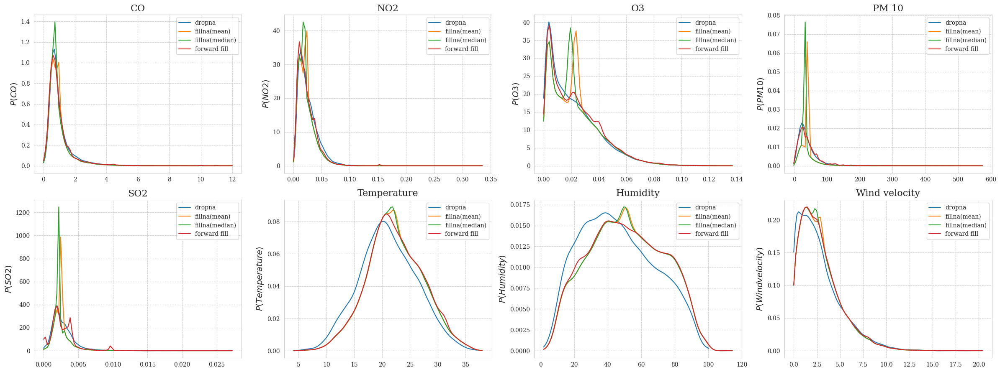

In [ ]:
# Repeating the distribution comparison to see the effects of the recent cleaning
list_clean_x = []
list_clean_y = []
list_clean_x1 = []
list_clean_y1 = []
list_clean_x2 = []
list_clean_y2 = []
list_clean_x3 = []
list_clean_y3 = []

for i in range(len(list_clean_values_dropna)):
    kde = gaussian_kde(list_clean_values_dropna[i])
    x = np.linspace(min(list_clean_values_dropna[i]), max(list_clean_values_dropna[i]), 100)
    list_clean_x.append(x)
    list_clean_y.append(kde(x))

    kde1 = gaussian_kde(list_clean_imputed_values1[i])
    x1 = np.linspace(min(list_clean_imputed_values1[i]), max(list_clean_imputed_values1[i]), 100)
    list_clean_x1.append(x1)
    list_clean_y1.append(kde1(x1))

    kde2 = gaussian_kde(list_clean_imputed_values2[i])
    x2 = np.linspace(min(list_clean_imputed_values2[i]), max(list_clean_imputed_values2[i]), 100)
    list_clean_x2.append(x2)
    list_clean_y2.append(kde2(x2))

    kde3 = gaussian_kde(list_clean_imputed_values3[i])
    x3 = np.linspace(min(list_clean_imputed_values3[i]), max(list_clean_imputed_values3[i]), 100)
    list_clean_x3.append(x3)
    list_clean_y3.append(kde3(x3))

# Plotting distributions
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].plot(list_clean_x[k],  list_clean_y[k], label = 'dropna')
        ax[i,j].plot(list_clean_x1[k], list_clean_y1[k], label = 'fillna(mean)')
        ax[i,j].plot(list_clean_x2[k], list_clean_y2[k], label = 'fillna(median)')
        ax[i,j].plot(list_clean_x3[k], list_clean_y3[k], label = 'forward fill')
        ax[i,j].legend(loc = 'best')
        ax[i,j].set(title = list_columns[k])
        ax[i,j].set(ylabel = "$P({})$".format(list_columns[k]))
        fig.tight_layout()  
        k += 1

The peaks in the temperature and humidity distributions have disappeared and the SO2 distribution got rid of the outlier, now it is clear that the dataset produced with forward filling imputing might be the best candidate to capture the underlying data distribution while maintining a decent amount of data

In [ ]:
# Looking at stat summary of chosen dataset
df_aqi_clean_imputed3.describe()

,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
count,70270.000000,70270.000000,70270.000000,70270.000000,70270.000000,70270.000000,70270.000000,70270.000000
mean,0.979176,0.023547,0.022835,41.278703,0.002721,22.324553,50.909517,2.884360
std,0.829328,0.016594,0.018478,33.190197,0.001800,5.028176,22.022045,2.176346
min,0.002100,0.000550,0.000000,-1.090000,0.000000,4.100000,1.800000,0.000000
25%,0.531000,0.011670,0.006920,20.980000,0.001640,19.000000,33.700000,1.300000
50%,0.760000,0.019730,0.019480,32.760000,0.002300,22.000000,50.100000,2.500000
75%,1.120000,0.031470,0.033877,51.370000,0.003640,25.800000,68.500000,4.000000
max,12.000000,0.335270,0.136950,574.750000,0.027220,38.000000,114.400000,20.400000


In [ ]:
# Creating correlation matrix with pandas built-in methods
aqi_corr = df_aqi_clean_imputed3.corr()
aqi_corr.style.background_gradient(cmap = 'RdBu', axis = None).set_precision(2)

<ipython-input-19-b42770674dce>:3: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  aqi_corr.style.background_gradient(cmap = 'RdBu', axis = None).set_precision(2)


,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
CO,1.00,0.51,-0.35,0.29,0.28,-0.27,0.06,-0.27
NO2,0.51,1.00,-0.38,0.25,0.20,-0.30,-0.05,-0.31
O3,-0.35,-0.38,1.00,-0.13,-0.13,0.64,-0.49,0.39
PM 10,0.29,0.25,-0.13,1.00,0.24,-0.04,-0.08,-0.14
SO2,0.28,0.20,-0.13,0.24,1.00,-0.09,-0.09,-0.22
Temperature,-0.27,-0.30,0.64,-0.04,-0.09,1.00,-0.51,0.42
Humidity,0.06,-0.05,-0.49,-0.08,-0.09,-0.51,1.00,-0.36
Wind velocity,-0.27,-0.31,0.39,-0.14,-0.22,0.42,-0.36,1.00


## **<font color="#84f745">1.2 OUTLIER DETECTION</font>**

In [ ]:
# Fitting a PCA model with 2 components to visualize 
X_train = df_aqi_clean_imputed3.iloc[:,1:9].values
pca = PCA(n_components = 2)
X_train_pca = pca.fit_transform(X_train)

# Calculating distances among pair of neighbor points
nbr = NearestNeighbors(n_neighbors = 2)
nbrs = nbr.fit(X_train_pca)
distances, indices = nbrs.kneighbors(X_train_pca)
distances = np.sort(distances, axis = 0)
distances = distances[:, 1]

# Plotting k-distances
fig = px.line(y = distances, title = 'K-distance elbow method')
fig.update_layout(xaxis_range = [0, 71000])
fig.show()

Outliers found by DBSCAN: 249


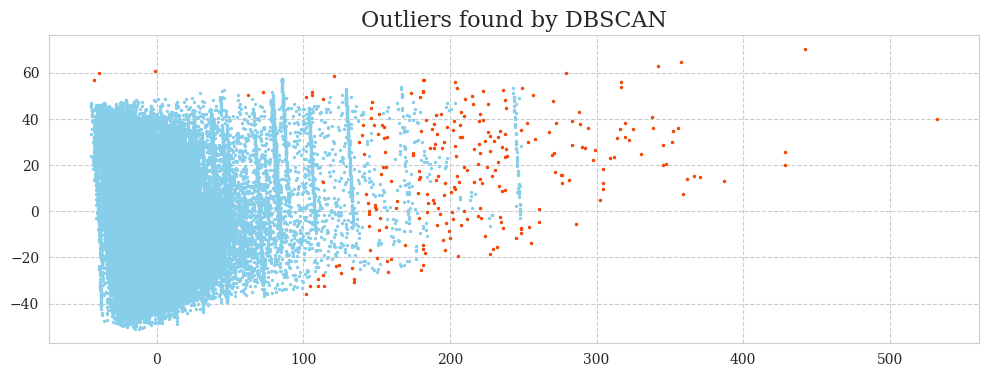

In [ ]:
# DBSCAN model using eps obtained from previous elbow method
dbscan = DBSCAN(eps = 3.8, min_samples = 4)
dbscan.fit(X_train_pca)

# Identifiying outliers found by DBSCAN
anomalies_db = np.where(dbscan.labels_ == -1)
anomalies_db_pca = X_train_pca[anomalies_db]
print('Outliers found by DBSCAN:', len(anomalies_db_pca))

# Plotting outliers on the 2 dimensional PCA space
fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_pca[:,0], X_train_pca[:,1], color = 'skyblue', s = 2)
plt.scatter(anomalies_db_pca[:,0], anomalies_db_pca[:,1], color = 'orangered', s = 2)
plt.title("Outliers found by DBSCAN")
plt.show()

Outliers found by Isolation Forest: 141


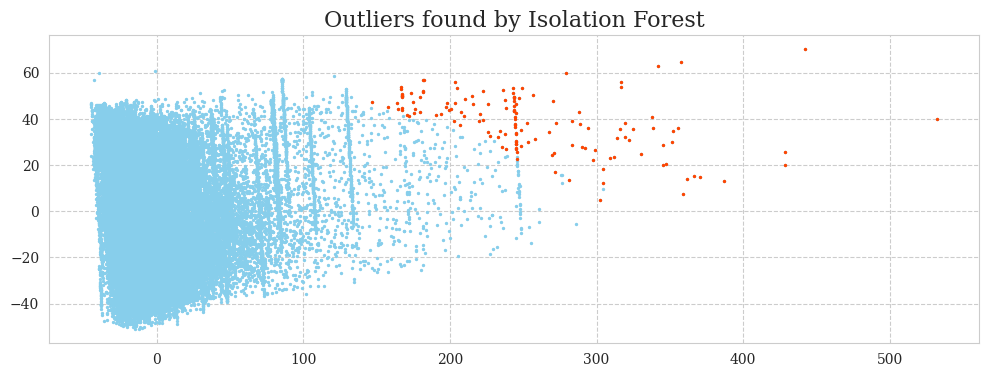

In [ ]:
# Isolation Forest model
isol = IsolationForest(bootstrap = True,  
                       contamination = 0.002, 
                       max_samples = 200, 
                       n_estimators = 1000, 
                       n_jobs = -1).fit(X_train_pca)

# Identifiying outliers found by Isolation Forest
outliers_isol = isol.predict(X_train_pca)
anomalies_isol = np.where(outliers_isol == -1)
anomalies_isol_pca = X_train_pca[anomalies_isol]
print('Outliers found by Isolation Forest:', len(anomalies_isol_pca))

# Plotting outliers
fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_pca[:,0], X_train_pca[:,1], color = 'skyblue', s = 2)
plt.scatter(anomalies_isol_pca[:,0], anomalies_isol_pca[:,1], color = 'orangered', s = 2)
plt.title("Outliers found by Isolation Forest")
plt.show()

Outliers found by LOF: 141


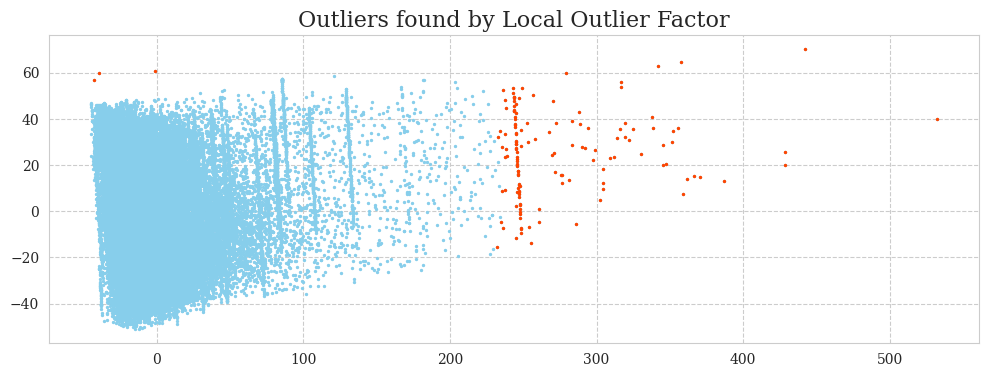

In [ ]:
# Local Outlier Factor
lof = LocalOutlierFactor(n_neighbors = 1000,
                         contamination = .002,
                         algorithm = 'kd_tree')

# Identifiying outliers found by Local Outlier Factor
outliers_lof = lof.fit_predict(X_train_pca)
anomalies_lof = np.where(outliers_lof == -1)
anomalies_lof_pca = X_train_pca[anomalies_lof]
print('Outliers found by LOF:', len(anomalies_lof_pca))

# Plotting outliers
fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_pca[:,0], X_train_pca[:,1], color = 'skyblue', s = 2)
plt.scatter(anomalies_lof_pca[:,0], anomalies_lof_pca[:,1], color = 'orangered', s = 2)
plt.title("Outliers found by Local Outlier Factor")
plt.show()

Final outliers: 141


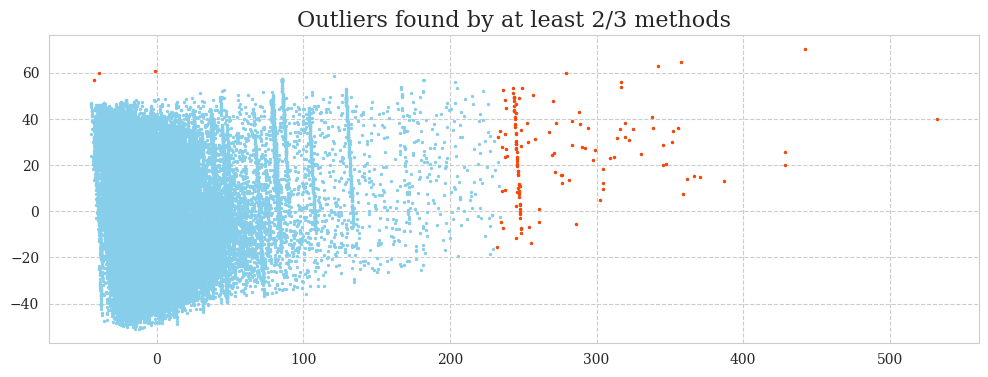

In [ ]:
# Making list with all outliers, including duplicates
list_all_outliers = []
for i,j,k in zip(anomalies_db, anomalies_lof, anomalies_lof):
    list_all_outliers.extend(i)
    list_all_outliers.extend(j)
    list_all_outliers.extend(k)

# Selecting outliers that were obtained with at least 2/3 methods
list_final_outliers = []
for item, count in collections.Counter(list_all_outliers).items(): 
    if count >= 2:
        list_final_outliers.append(item)

anomalies_final_pca = X_train_pca[list_final_outliers]
print('Final outliers:', len(anomalies_final_pca))

# Final plot of outliers
fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_pca[:,0], X_train_pca[:,1], color = 'skyblue', s = 2)
plt.scatter(anomalies_final_pca[:,0], anomalies_final_pca[:,1], color = 'orangered', s = 2)
plt.title("Outliers found by at least 2/3 methods")
plt.show()

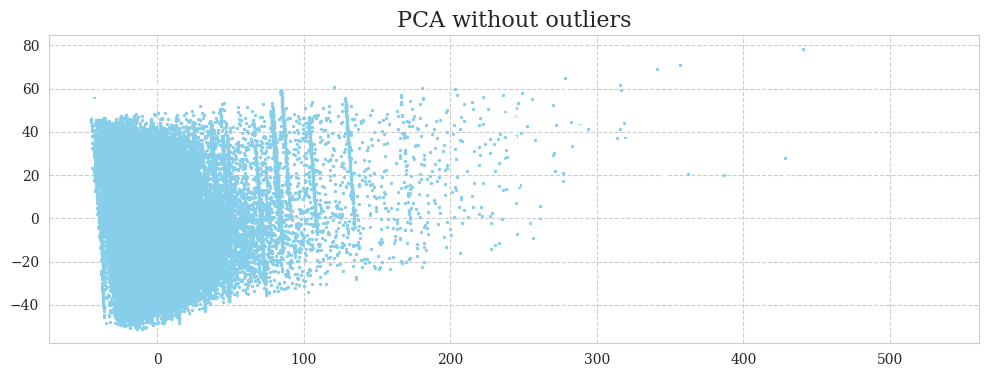

In [ ]:
# Creating dataframe without anoamlies
df_aqi_noanomalies = df_aqi_clean_imputed3.copy()
df_aqi_noanomalies.drop(list_final_outliers, inplace = True)
df_aqi_noanomalies = df_aqi_noanomalies.reset_index(drop = True)
X_train_noanomalies = df_aqi_noanomalies.iloc[:,1:9].values

# Fitting PCA model with values without outliers
pca = PCA(n_components = 2)
X_train_noanomalies_pca = pca.fit_transform(X_train_noanomalies)

# PCA 2 dimensional plot without outliers
fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_noanomalies_pca[:,0], X_train_noanomalies_pca[:,1], color = 'skyblue', s = 2)
plt.scatter(anomalies_final_pca[:,0], anomalies_final_pca[:,1], color = 'white', s = 2)
plt.title("PCA without outliers") 
plt.show()

In [ ]:
# Taking a look at the features after removing outliers
df_aqi_noanomalies.describe()

,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
count,70129.000000,70129.000000,70129.000000,70129.000000,70129.000000,70129.000000,70129.000000,70129.000000
mean,0.975676,0.023500,0.022860,40.859651,0.002719,22.326815,50.911964,2.886746
std,0.824434,0.016551,0.018471,31.477784,0.001801,5.027665,22.026445,2.175961
min,0.002100,0.000550,0.000000,-1.090000,0.000000,4.100000,1.800000,0.000000
25%,0.531000,0.011650,0.006970,20.950000,0.001640,19.000000,33.700000,1.300000
50%,0.759000,0.019700,0.019520,32.760000,0.002300,22.000000,50.100000,2.500000
75%,1.117000,0.031380,0.033900,51.190000,0.003630,25.800000,68.500000,4.000000
max,12.000000,0.335270,0.136950,487.770000,0.027220,38.000000,111.500000,19.900000


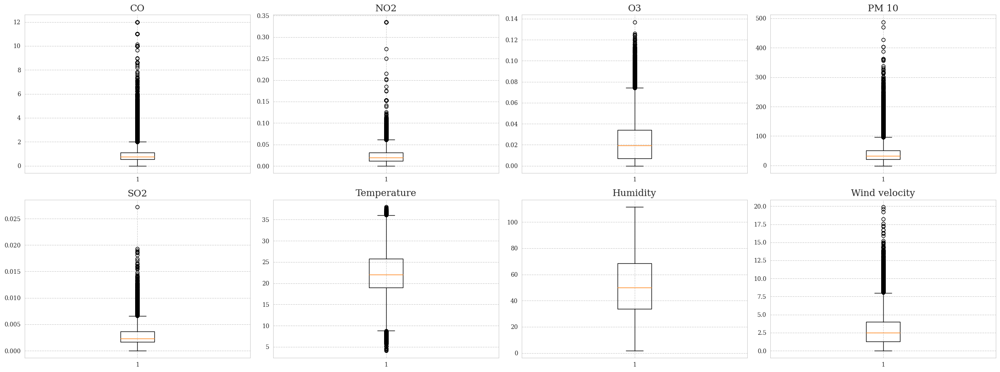

In [ ]:
# Plotting boxplot for each feature
list_values_noanomalies = [df_aqi_noanomalies.iloc[:,i].values for i in range(1,9)]

fig, ax = plt.subplots(nrows = 2, ncols = 4, figsize = (24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].boxplot(list_values_noanomalies[k])
        ax[i,j].set(title = list_columns[k])
        fig.tight_layout()
        k += 1

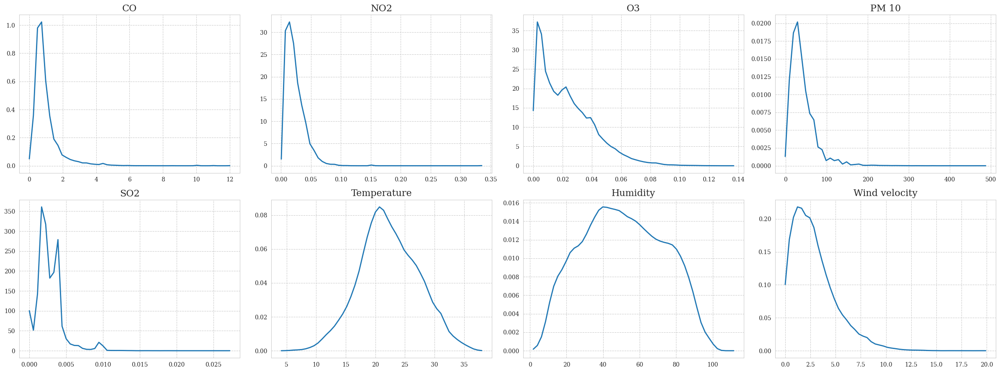

In [ ]:
# Obtaining distribution of each feature using KDE method
list_x = []
list_y = []

for i in range(len(list_values_noanomalies)):
    kde = gaussian_kde(list_values_noanomalies[i])
    x = np.linspace(min(list_values_noanomalies[i]), max(list_values_noanomalies[i]), 50)
    list_x.append(x)
    list_y.append(kde(x))

# Plotting histogram for each feature in dataset
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(24, 9))
k = 0
for i in range(2):
    for j in range(4):
        ax[i,j].plot(list_x[k], list_y[k], linewidth = 2)
        ax[i,j].set(title = list_columns[k])
        fig.tight_layout()
        k += 1

## **<font color="#84f745">1.3 PREPARING DATA</font>**

In [ ]:
# Assigning the new df_aqi dataset to the one without outliers and creating its training dataset
X_train = df_aqi_noanomalies.iloc[:,1:9].values

PREPARING DATA IN DIFFERENT GRANULARITIES

In [ ]:
# Grouping observations by individual days and monitoring point to end up with one record daily for each stations
df_aqi_daily_station = df_aqi_noanomalies.groupby([df_aqi_noanomalies['Datetime'].dt.date, 'Station']).mean().reset_index()

df_aqi_daily_station.rename(columns = {'Datetime':'Date'}, inplace = True)
print('Number of records:', len(df_aqi_daily_station))
display(pd.concat([df_aqi_daily_station.head(2), df_aqi_daily_station.tail(2)])) 

Number of records: 2927


,Date,Station,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,2016-01-01,Atemajac,1.382750,0.025950,0.018440,56.328333,0.001819,20.554167,61.054167,2.470833
1,2016-01-01,Las Aguilas,1.034125,0.022458,0.021056,31.462500,0.001260,20.191667,63.162500,2.291667
2925,2016-12-31,Tlaquepaque,0.673792,0.018029,0.017060,48.090000,0.001278,21.291667,46.004167,3.145833
2926,2016-12-31,Vallarta,1.655000,0.011878,0.036045,48.620000,0.001888,22.050000,49.783333,4.637500


In [ ]:
# Grouping observations by individual days and monitoring point to end up with one record daily for each stations
df_aqi_daily = df_aqi_noanomalies.groupby([df_aqi_noanomalies['Datetime'].dt.date]).mean().reset_index()

df_aqi_daily.rename(columns = {'Datetime':'Date'}, inplace = True)
print('Number of records:', len(df_aqi_daily))
display(pd.concat([df_aqi_daily.head(2), df_aqi_daily.tail(2)])) 

Number of records: 366


,Date,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,2016-01-01,1.728708,0.023657,0.017694,55.246875,0.003215,21.203646,62.432813,1.769271
1,2016-01-02,1.212644,0.030538,0.020074,38.896667,0.002868,19.340625,40.762500,2.681250
364,2016-12-30,1.072862,0.023925,0.016177,53.502963,0.003199,20.558201,49.850794,2.334392
365,2016-12-31,0.869859,0.019137,0.023946,55.884531,0.002755,21.705729,50.426042,3.519792


In [ ]:
 # Grouping observations by month and monitoring point to end up with one record for each month and monitoring station
df_aqi_monthly_station = df_aqi_noanomalies.groupby([df_aqi_noanomalies['Datetime'].dt.month, 'Station']).mean().reset_index()

calendar = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'}
            
df_aqi_monthly_station.rename(columns = {'Datetime':'Month'}, inplace = True)
df_aqi_monthly_station['Month'] = df_aqi_monthly_station['Month'].map(calendar)

print('Number of records:', len(df_aqi_monthly_station))
display(pd.concat([df_aqi_monthly_station.head(2),  df_aqi_monthly_station.tail(2)])) 

Number of records: 96


,Month,Station,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,Jan,Atemajac,1.283647,0.030374,0.022286,43.410645,0.002390,18.828763,44.575269,3.493817
1,Jan,Las Aguilas,0.936667,0.039953,0.022167,29.725833,0.001993,18.183065,45.434543,3.383199
94,Dec,Tlaquepaque,1.441532,0.028261,0.016235,48.380727,0.002628,20.500000,47.129744,2.174697
95,Dec,Vallarta,1.358370,0.030548,0.027088,32.021062,0.001973,21.475941,49.561022,2.921640


In [ ]:
# Grouping observations by individual hours of the day and monitoring point to end up with one record for each particular hour
df_aqi_hour_station = df_aqi_noanomalies.groupby([df_aqi_noanomalies['Datetime'].dt.hour, 'Station']).mean().reset_index()

df_aqi_hour_station.rename(columns = {'Datetime':'Hour'}, inplace = True)
df_aqi_hour_station['Hour'] = df_aqi_hour_station['Hour'] + 1

print('Number of records:', len(df_aqi_hour_station))
display(pd.concat([df_aqi_hour_station.head(2),  df_aqi_hour_station.tail(2)])) 

Number of records: 192


,Hour,Station,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,1,Atemajac,0.952719,0.021528,0.016503,38.058634,0.001890,20.083880,55.086066,3.300000
1,1,Las Aguilas,0.702407,0.025992,0.018168,23.750109,0.001225,19.460383,57.080328,3.348634
190,24,Tlaquepaque,1.337851,0.029781,0.011051,39.099617,0.002971,20.528689,51.091803,2.463661
191,24,Vallarta,0.908583,0.020978,0.022003,31.947459,0.001939,21.751639,54.495082,3.607104


In [ ]:
# Grouping observations by individual days of the week and monitoring point to end up with one record for each day of the week
df_aqi_dayweek_station = df_aqi_noanomalies.groupby([df_aqi_noanomalies['Datetime'].dt.dayofweek, 'Station']).mean().reset_index()

df_aqi_dayweek_station.rename(columns = {'Datetime':'Day of week'}, inplace = True)
df_aqi_dayweek_station['Day of week'] = df_aqi_dayweek_station['Day of week'] + 1

print('Number of records:', len(df_aqi_dayweek_station))
display(pd.concat([df_aqi_dayweek_station.head(2),  df_aqi_dayweek_station.tail(2)])) 

Number of records: 56


,Day of week,Station,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,1,Atemajac,1.142730,0.022365,0.023859,36.927011,0.001958,22.229567,48.392949,3.687340
1,1,Las Aguilas,0.868251,0.028448,0.024636,25.186153,0.001330,20.858072,52.481687,3.625382
54,7,Tlaquepaque,0.972167,0.022734,0.017873,34.941923,0.002247,21.798958,47.658093,2.640385
55,7,Vallarta,0.811275,0.017083,0.030821,30.608894,0.001930,22.528446,51.406731,3.543189


In [ ]:
# Grouping observations by monitoring point to end up with one record for each station
df_aqi_station = df_aqi_noanomalies.groupby([df_aqi_noanomalies['Station']]).mean().reset_index()

print('Number of records:', len(df_aqi_station))
display(pd.concat([df_aqi_station.head(2),  df_aqi_station.tail(2)])) 

Number of records: 8


,Station,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,Atemajac,1.145981,0.022764,0.023060,37.911932,0.002009,22.231375,47.670571,3.749647
1,Las Aguilas,0.828904,0.029378,0.023875,26.092817,0.001356,20.933185,51.160680,3.706865
6,Tlaquepaque,1.054938,0.024249,0.017809,36.342028,0.002431,21.876532,47.009127,2.760522
7,Vallarta,0.911829,0.019373,0.029833,32.266152,0.001931,22.696000,50.347497,3.678153


# **<font color="#ffb94f">2.0 VISUALIZATION</font>**

## **<font color="#84f745">2.1 TIME SERIES</font>**

Having a first look at visualizing data with different granularities, first with all the data available, then separated by monthly means of the measurements and then daily. Alternative groupings such as by hour of the day or day of the week are analyzed to see if there's any trend therein

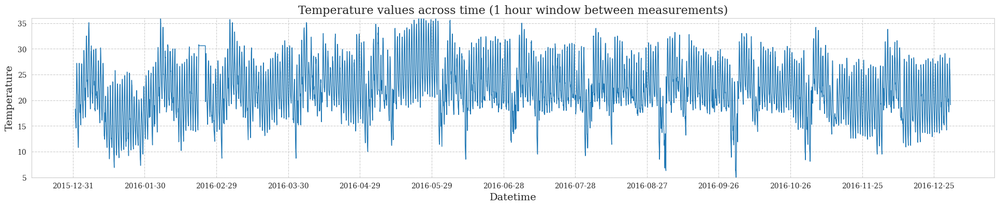

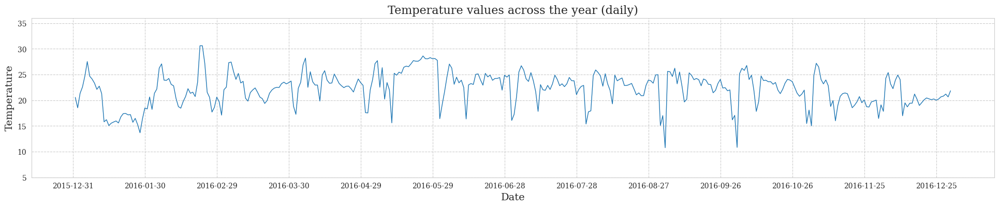

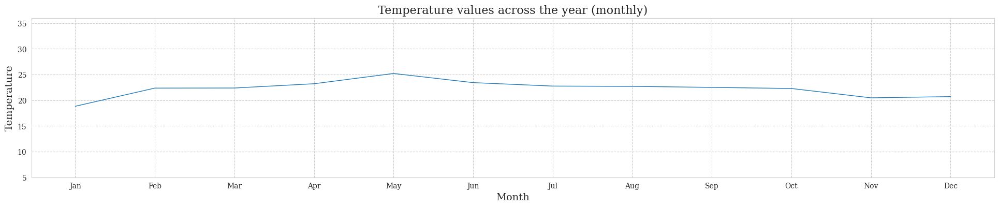

In [ ]:
# Looking at temp measurement from a certain station with all the data available
fig, ax = plt.subplots(figsize=(24, 4))
ax = sns.lineplot(data = df_aqi_noanomalies[df_aqi_noanomalies['Station'] == 'Atemajac'], x = 'Datetime', y = 'Temperature', lw = 1)
ax.xaxis.set_major_locator(ticker.MultipleLocator(30))
plt.title('Temperature values across time (1 hour window between measurements)')
plt.ylim(5, 36)
plt.show()

# Looking at temp measurement from a certain station with the data grouped by daily measurements
fig, ax = plt.subplots(figsize = (24, 4))
ax = sns.lineplot(data = df_aqi_daily_station[df_aqi_daily_station['Station'] == 'Atemajac'], x = 'Date', y = 'Temperature', lw = 1)
ax.xaxis.set_major_locator(ticker.MultipleLocator(30))
plt.title('Temperature values across the year (daily)')
plt.ylim(5, 36)
plt.show()

# Looking at temp measurement from a certain station with the data grouped by monthly measurements
fig, ax = plt.subplots(figsize = (24, 4))
ax = sns.lineplot(data = df_aqi_monthly_station[df_aqi_monthly_station['Station'] == 'Atemajac'], x = 'Month', y = 'Temperature', lw = 1)
ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.title('Temperature values across the year (monthly)')
plt.ylim(5, 36)
plt.show()

As seen from the previous plot, different granularities capture different aspects of the data, considering that there are 8 stations to analyze, using all data might prove to be to dense for visualization and time series analysis, the monthly grouping on the other hand is very clear and simple, but perhaps too much, it might be useful to visualize general trends. Finally, the daily grouping hits just the sweet spot for visualizing and analyzing temporal data


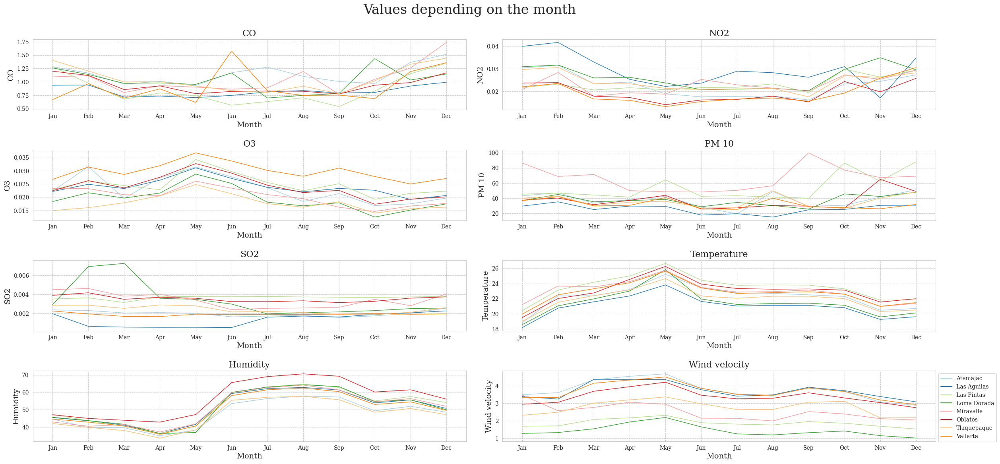

In [ ]:
# Looking at the trends in the different monthly measurements across all year with on every station
fig, ax = plt.subplots(nrows = 4, ncols = 2, figsize = (24, 12))
k = 0
for i in range(4):
    for j in range(2):
        sns.lineplot(ax = ax[i,j], data = df_aqi_monthly_station, x = 'Month', y = list_columns[k], hue = 'Station', palette = 'Paired', lw = 1)
        ax[i,j].set(title = list_columns[k])
        ax[i,j].legend([],[], frameon = False)
        ax[i,j].xaxis.set_major_locator(ticker.MultipleLocator(1))
        fig.suptitle('Values depending on the month', fontsize = 24)
        fig.tight_layout(pad = 2.0)
        k += 1
        
plt.legend(bbox_to_anchor = (1, 1))
plt.show()

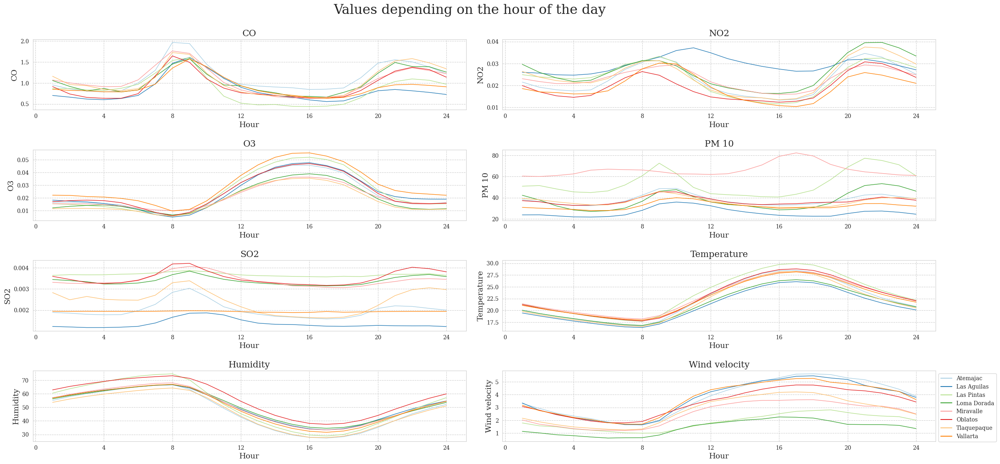

In [ ]:
# Plotting aggregated values across each different hour of the day for each station
fig, ax = plt.subplots(nrows = 4, ncols = 2, figsize = (24, 12))
k = 0
for i in range(4):
    for j in range(2):
        sns.lineplot(ax = ax[i,j], data = df_aqi_hour_station, x = 'Hour', y = list_columns[k], hue = 'Station', palette = 'Paired', lw = 1)
        ax[i,j].set(title = list_columns[k])
        ax[i,j].legend([],[], frameon = False)
        ax[i,j].xaxis.set_major_locator(ticker.MultipleLocator(4))
        fig.suptitle('Values depending on the hour of the day', fontsize = 24)
        fig.tight_layout(pad = 2.0)
        k += 1
        
plt.legend(bbox_to_anchor = (1, 1))
plt.show()

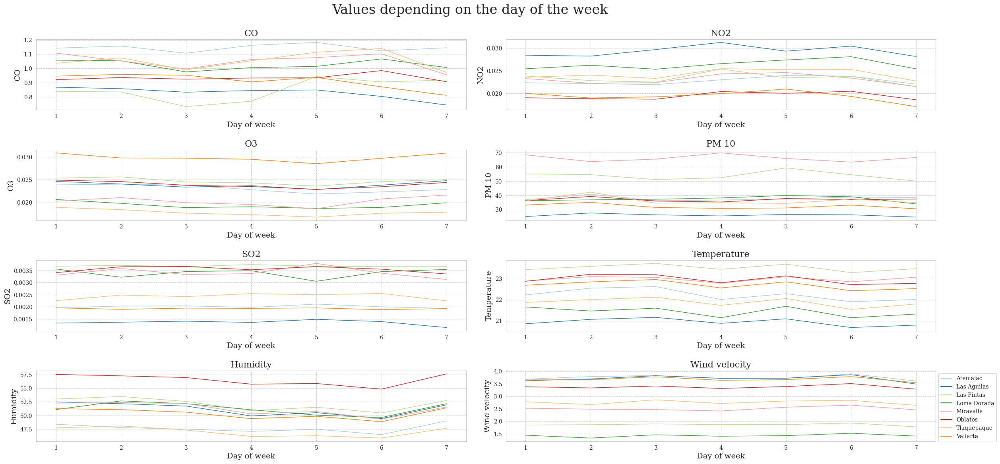

In [ ]:
# Plotting aggregated values across each different day of the week for each station
fig, ax = plt.subplots(nrows = 4, ncols = 2, figsize = (24, 12))
k = 0
for i in range(4):
    for j in range(2):
        sns.lineplot(ax = ax[i,j], data = df_aqi_dayweek_station, x = 'Day of week', y = list_columns[k], hue = 'Station', palette = 'Paired', lw = 1)
        ax[i,j].set(title = list_columns[k])
        ax[i,j].legend([],[], frameon=False)
        ax[i,j].xaxis.set_major_locator(ticker.MultipleLocator(1))
        fig.suptitle('Values depending on the day of the week', fontsize = 24)
        fig.tight_layout(pad = 2.0)
        k += 1

plt.legend(bbox_to_anchor = (1, 1))
plt.show()

In [ ]:
# Using plotly to plot interactive lineplots for daily measurements of all values, with plotly, it is possible to select which stations are shown on the plot
for feature in list_columns:
    fig = px.line(x = df_aqi_daily['Date'], y = df_aqi_daily[feature], title = feature)
    fig.update_layout(title_text = feature + ' daily aggregated values', title_x = 0.5)
    fig.update_layout(width = 1400, height = 300, margin = dict(t = 50, b = 10, l = 10, r = 10), xaxis_title = '', yaxis_title = feature)
    fig.show()

In [ ]:
# Using plotly to plot interactive lineplots for daily measurements of all values, with plotly, it is possible to select which stations are shown on the plot
palette = list(sns.color_palette(palette = 'Paired', n_colors = len(list_monitor_station)).as_hex())

for feature in list_columns:
    fig = go.Figure()
    for station, p in zip(list_monitor_station, palette):
        fig.add_trace(go.Scatter(x = df_aqi_daily_station[df_aqi_daily_station['Station'] == station]['Date'],
                                 y = df_aqi_daily_station[df_aqi_daily_station['Station'] == station][feature],
                                 name = station,
                                 line_color = p))
    fig.update_layout(title_text = feature + ' daily values by station', title_x = 0.5)
    fig.update_layout(autosize = False, width = 1400, height = 400, margin = dict(t = 50, b = 10, l = 10, r = 10))
    fig.show()

In [ ]:
# Plotting facet grids to compare each station values to the rest of the stations
for feature in list_columns:
    grid = sns.relplot(data = df_aqi_daily_station, x = "Date", y = feature,
                      col = "Station", hue = "Station",
                      kind = "line", palette = "Spectral",   
                      linewidth = 3, zorder = 4, col_wrap = 4, 
                      height = 3, aspect = 1.5, legend = False)

    #add text and silhouettes
    for time, ax in grid.axes_dict.items():
        ax.text(.1, .85, time, transform = ax.transAxes, fontweight = "bold")
        sns.lineplot(data = df_aqi_daily_station, x = "Date", y = feature, units = "Station",
                    estimator = None, color= ".7", linewidth = 1, ax = ax)

    ax.xaxis.set_major_locator(ticker.MultipleLocator(100))
    grid.set_titles("")
    grid.fig.suptitle('{} values across time separated by monitoring station'.format(feature))
    grid.set_axis_labels("", "{}".format(feature))
    grid.tight_layout(pad = 2.0)

In [ ]:
# Radial plots
for feature in list_columns:
    fig = go.Figure()
    
    for station, p in zip(list_monitor_station, palette):
        fig.add_trace(go.Scatterpolar(r = df_aqi_monthly_station[df_aqi_monthly_station['Station'] == station][feature],
                                      theta = df_aqi_monthly_station[df_aqi_monthly_station['Station'] == station]['Month'],
                                      name = station, marker = dict(color = p)))
    fig.update_layout(title_text = feature + ' monthly values by station', title_x = 0.5)
    fig.update_layout(showlegend = True, width = 600, height = 500, margin = dict(t = 50, b = 50, l = 50, r = 50))
    fig.show()  

## **<font color="#84f745">2.2 GEOGRAPHIC DATA</font>**

In [ ]:
%%capture
# Official administrative divisions to use as tessellations for each geographical area
url_area = 'https://raw.githubusercontent.com/Bruno-Limon/air-quality-analysis/main/area-ZMG.geojson'

area_base = gpd.read_file(url_area)
area_merged = gpd.GeoSeries(unary_union(area_base['geometry']))

# Loading official city boundaries                     
official_tessellation = gpd.read_file(url_area)
official_tessellation.insert(0, 'tile_ID', range(0, len(official_tessellation)))
official_tessellation['mun_name'] = official_tessellation['mun_name'].str[0]
official_tessellation = official_tessellation.set_crs({'init': 'epsg:4326'}, allow_override=True)

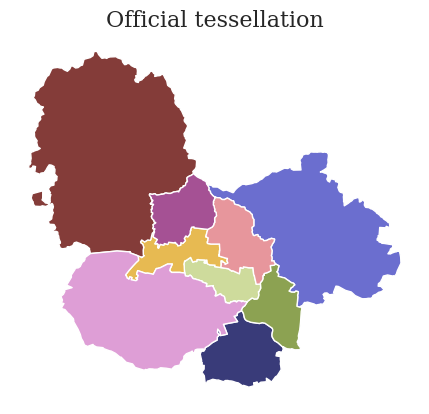

,tile_ID,geo_point_2d,year,sta_code,sta_name,mun_code,mun_name,mun_area_code,mun_type,geometry
0,0,"{'lon': -103.20737336529787, 'lat': 20.3916398...",2022,[14],[Jalisco],[14044],Ixtlahuacán de los Membrillos,MEX,municipio,"POLYGON ((-103.12160 20.40552, -103.13283 20.4..."
1,1,"{'lon': -103.04883967584755, 'lat': 20.6360458...",2022,[14],[Jalisco],[14124],Zapotlanejo,MEX,municipio,"POLYGON ((-103.02471 20.79245, -103.02581 20.7..."
2,2,"{'lon': -103.13520885864084, 'lat': 20.4817194...",2022,[14],[Jalisco],[14051],Juanacatlán,MEX,municipio,"POLYGON ((-103.08099 20.48770, -103.08233 20.4..."
3,3,"{'lon': -103.24545860157885, 'lat': 20.5390308...",2022,[14],[Jalisco],[14070],El Salto,MEX,municipio,"POLYGON ((-103.25425 20.56486, -103.26769 20.5..."
4,4,"{'lon': -103.3478445479885, 'lat': 20.59148370...",2022,[14],[Jalisco],[14098],San Pedro Tlaquepaque,MEX,municipio,"POLYGON ((-103.28223 20.64118, -103.29058 20.6..."


In [ ]:
# Observing official municipal tessellation
tess_color = "tab20b"
official_tessellation.plot(cmap = tess_color)
plt.title('Official tessellation')
plt.axis('off')
plt.show()

official_tessellation.head()

In [ ]:
%%capture

# Points to build voronoi tessellation, locations of monitoring stations
dict_station_coord = {'Oblatos': (20.700501, -103.296648),
                      'Loma Dorada': (20.631665, -103.256809),
                      'Atemajac': (20.719626, -103.355412),
                      'Miravalle': (20.614511, -103.343352),
                      'Las Pintas': (20.576708, -103.326533),
                      'Las Aguilas': (20.630983, -103.416735),
                      'Tlaquepaque': (20.640941, -103.312497),
                      'Vallarta': (20.680141, -103.398572),                  
                      }

# Creating polygon of city boundaries for each area using shapely's function unary_union
area_boundary = unary_union(area_base.geometry)
voronoi_points = np.array([[lng, lat] for (lat, lng) in dict_station_coord.values()])
region_polys, region_pts = voronoi_regions_from_coords(voronoi_points, area_boundary)
voronoi_tessellation = gpd.GeoDataFrame(columns = ['geometry'], crs = {'init': 'epsg:4326'})
voronoi_tessellation['name'] = ['cell ' + str(i) for i in range(1, len(region_polys) + 1)]
voronoi_tessellation['geometry'] = [region_polys[index] for index, row in voronoi_tessellation.iterrows()]
voronoi_tessellation['lat'] = [lat for (lat, lng) in dict_station_coord.values()]
voronoi_tessellation['lng'] = [lng for (lat, lng) in dict_station_coord.values()]

voronoi_tessellation['Station'] = [caseta for caseta, (lat, lng) in dict_station_coord.items()]
voronoi_tessellation = voronoi_tessellation.explode().reset_index(drop = True).drop([1, 2]).reset_index(drop = True)

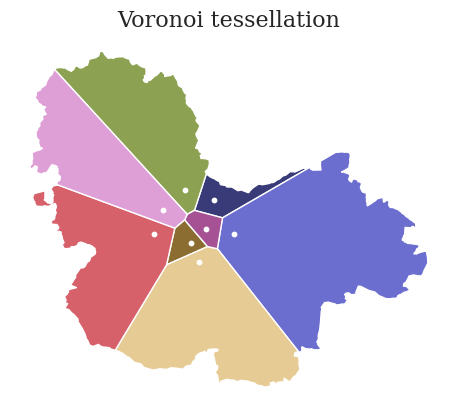

,name,lat,lng,Station,geometry
0,cell 1,20.700501,-103.296648,Oblatos,"POLYGON ((-103.31235 20.75266, -103.31014 20.7..."
1,cell 2,20.631665,-103.256809,Loma Dorada,"POLYGON ((-103.28001 20.66418, -103.10554 20.7..."
2,cell 3,20.719626,-103.355412,Atemajac,"POLYGON ((-103.61597 20.96111, -103.61561 20.9..."
3,cell 4,20.614511,-103.343352,Miravalle,"POLYGON ((-103.35571 20.66016, -103.30994 20.6..."
4,cell 5,20.576708,-103.326533,Las Pintas,"POLYGON ((-103.39181 20.57031, -103.30994 20.6..."
5,cell 6,20.630983,-103.416735,Las Aguilas,"POLYGON ((-103.37536 20.64363, -103.39181 20.5..."
6,cell 7,20.640941,-103.312497,Tlaquepaque,"POLYGON ((-103.35571 20.66016, -103.35070 20.6..."
7,cell 8,20.680141,-103.398572,Vallarta,"POLYGON ((-103.61083 20.73063, -103.61074 20.7..."


In [ ]:
gdf_voronoi_points = gpd.GeoDataFrame(geometry = gpd.points_from_xy(voronoi_points[:,0], voronoi_points[:,1]))

# Observing voronoi tessellation produced by using the locations of monitoring stations
tess_color = "tab20b"
fig, ax = plt.subplots(nrows = 1, ncols = 1) 
voronoi_tessellation.plot(ax = ax, cmap = tess_color)
gdf_voronoi_points.plot(ax = ax, color = 'white', markersize = 10)
ax.axis('off')
plt.title('Voronoi tessellation')
plt.show()

voronoi_tessellation

In [ ]:
# Merging voronoi tessellation with the data grouped by station so we can have 
gdf_merged_station = voronoi_tessellation.set_index('Station').join(df_aqi_station.set_index('Station')).reset_index()
print('Number of records:', len(gdf_merged_station))
display(pd.concat([gdf_merged_station.head(2),  gdf_merged_station.tail(2)])) 

Number of records: 8


,Station,name,lat,lng,geometry,CO,NO2,O3,PM 10,SO2,Temperature,Humidity,Wind velocity
0,Oblatos,cell 1,20.700501,-103.296648,"POLYGON ((-103.31235 20.75266, -103.31014 20.7...",0.934849,0.019445,0.023925,37.038506,0.003547,22.959682,56.535869,3.377315
1,Loma Dorada,cell 2,20.631665,-103.256809,"POLYGON ((-103.28001 20.66418, -103.10554 20.7...",1.026066,0.026368,0.019419,37.401337,0.003396,21.432616,51.252147,1.430248
6,Tlaquepaque,cell 7,20.640941,-103.312497,"POLYGON ((-103.35571 20.66016, -103.35070 20.6...",1.054938,0.024249,0.017809,36.342028,0.002431,21.876532,47.009127,2.760522
7,Vallarta,cell 8,20.680141,-103.398572,"POLYGON ((-103.61083 20.73063, -103.61074 20.7...",0.911829,0.019373,0.029833,32.266152,0.001931,22.696000,50.347497,3.678153


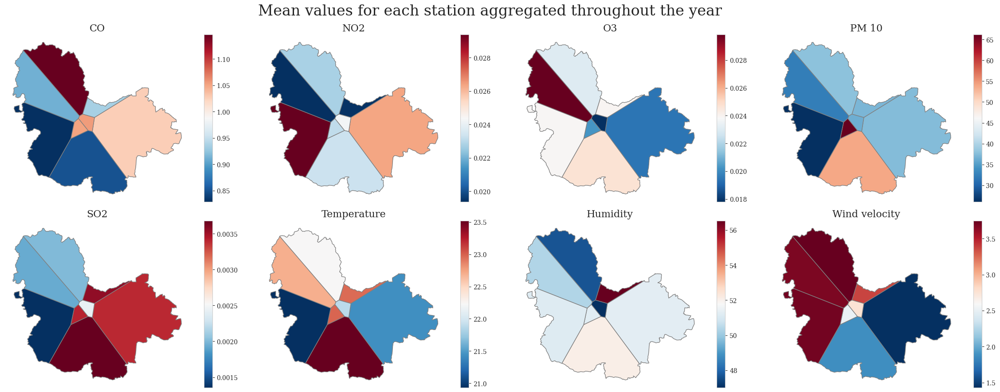

In [ ]:
# Plotting geodata for each cell of the voronoi tessellation, with the color corresponding to the 
fig, ax = plt.subplots(nrows = 2, ncols = 4, figsize = (24, 9))
k = 0
for i in range(2):
    for j in range(4):
        gdf_merged_station.plot(ax = ax[i,j], column = list_columns[k], cmap = 'RdBu_r', linewidth = 1, edgecolor = 'gray')
        ax[i,j].set(title = list_columns[k])
        ax[i,j].axis('off')
        sm = plt.cm.ScalarMappable(cmap = 'RdBu_r', norm = plt.Normalize(vmin = min(gdf_merged_station[list_columns[k]]), vmax = max(gdf_merged_station[list_columns[k]])))
        fig.colorbar(sm, ax = ax[i,j])
        fig.suptitle('Mean values for each station aggregated throughout the year', fontsize = 24)
        fig.tight_layout()
        k += 1

In [ ]:
# Plotting the previous plot this time with a slider to select between different months to filter the data shown
voronoi_tessellation_json = voronoi_tessellation.copy()
voronoi_tessellation_json.index = voronoi_tessellation['Station']
# voronoi_tessellation_json.drop(['name', 'lat', 'Station', 'lng'], axis=1, inplace=True)
voronoi_tessellation_json = json.loads(voronoi_tessellation_json.to_json())

# Choropleth map
for value in list_columns:
    fig = px.choropleth_mapbox(data_frame = df_aqi_monthly_station,
                               geojson = voronoi_tessellation_json,
                               locations = df_aqi_monthly_station.Station,
                               color = value,
                               center = {'lat':20.621236, 'lon':-103.355412},
                               mapbox_style = 'carto-positron',
                               zoom = 8,
                               color_continuous_scale = 'RdBu_r',
                               range_color = (min(df_aqi_monthly_station[value]), max(df_aqi_monthly_station[value])),
                               animation_frame = 'Month',
                               title = value,
                               opacity = .5,
                               width = 1400,
                               height = 600)
    fig.show()

In [ ]:
# Visualizing trajectories flowing through Area 3
map_f = folium.Map(location = [20.66682, -103.39182], zoom_start = 10, tiles = 'CartoDB positron')

# Outlining official tessellation and adding name of counties as folium popup
for _, row in gdf_merged_station.iterrows():
    sim_geo = gpd.GeoSeries(row['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data = geo_j, style_function = lambda x: {'fillColor': 'None', 'color': 'Blue'})
    folium.Circle([row['lat'], row['lng']], radius = 2000, weight = 1).add_to(geo_j)
    folium.CircleMarker([row['lat'], row['lng']], radius = 1, weight = 5, color = 'blue').add_to(geo_j)
    geo_j.add_to(map_f)

map_f

# **<font color="#ffb94f">3.0 DIMENSIONALITY REDUCTION</font>**

## **<font color="#84f745">3.1 PCA</font>**

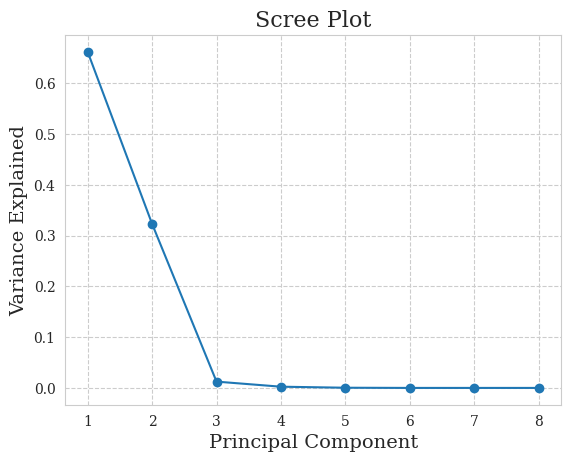

In [ ]:
pca = PCA(n_components=8)
Principal_components=pca.fit_transform(X_train)

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

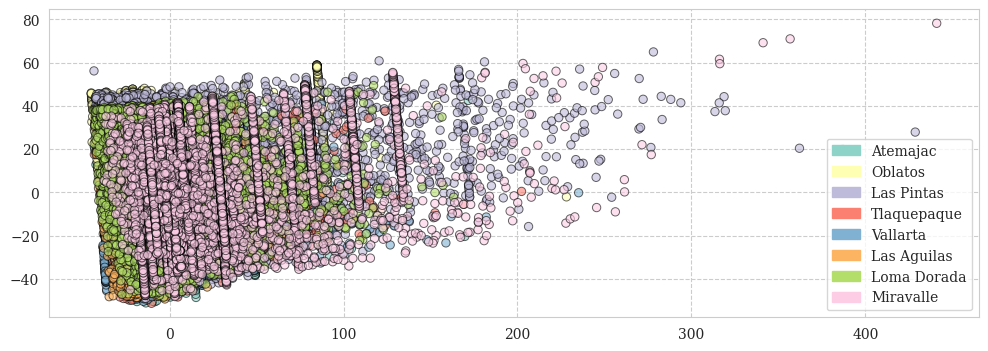

In [ ]:
pca = PCA(n_components = 2)
X_train_pca = pca.fit_transform(X_train)

levels, categories = pd.factorize(df_aqi_noanomalies['Station'])
colors = [plt.cm.Set3(i) for i in levels]
handles = [matplotlib.patches.Patch(color = plt.cm.Set3(i), label = c) for i, c in enumerate(categories)]

fig = plt.figure(figsize = (12, 4))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c = colors, edgecolor = 'k', alpha = .6, linewidth = .7)
plt.legend(handles=handles)
plt.show()

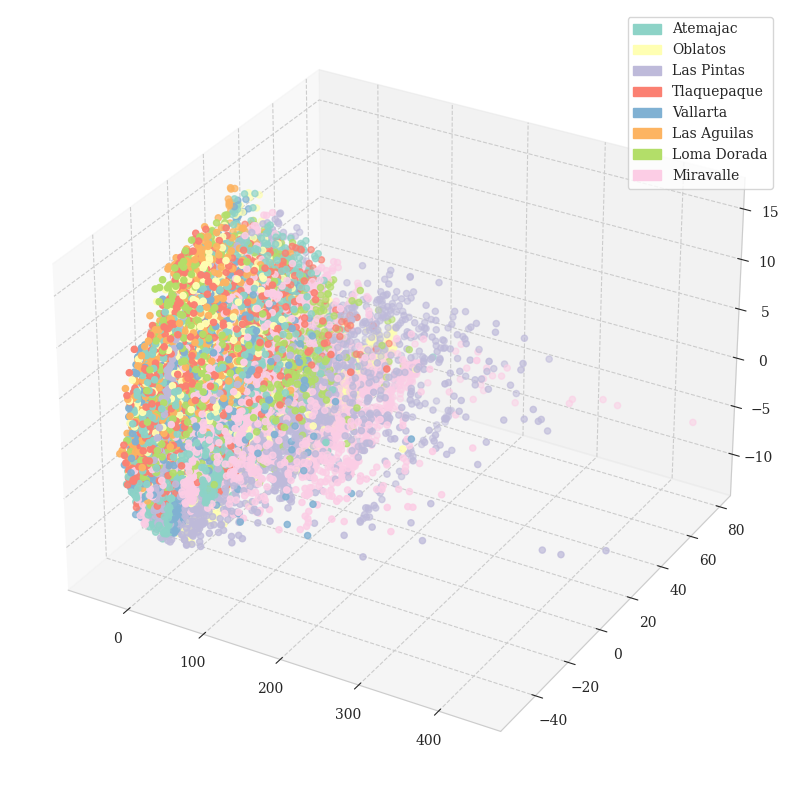

In [ ]:
pca = PCA(n_components=3)
aqi_pca = pca.fit_transform(X_train)

x = aqi_pca[:, 0]
y = aqi_pca[:, 1]
z = aqi_pca[:, 2]

levels, categories = pd.factorize(df_aqi_noanomalies['Station'])
colors = [plt.cm.Set3(i) for i in levels]
handles = [matplotlib.patches.Patch(color = plt.cm.Set3(i), label = c) for i, c in enumerate(categories)]

fig = plt.figure(figsize = (15, 10))
fig.tight_layout()
ax = plt.axes(projection = "3d")
ax.scatter3D(x, y, z, c = colors)
plt.legend(handles=handles)
plt.show()

## **<font color="#84f745">3.2 FEATURE SELECTION</font>**

In [ ]:
print('Raw variances')
df_aqi_noanomalies.iloc[:,1:9].var()

Raw variances


CO                 0.679692
NO2                0.000274
O3                 0.000341
PM 10            990.850858
SO2                0.000003
Temperature       25.277417
Humidity         485.164280
Wind velocity      4.734805
dtype: float64

In [ ]:
print('Normalized variances')
(df_aqi_noanomalies.iloc[:,1:9]/df_aqi_noanomalies.iloc[:,1:9].mean()).var()

Normalized variances


CO               0.714005
NO2              0.496047
O3               0.652888
PM 10            0.593498
SO2              0.438751
Temperature      0.050708
Humidity         0.187176
Wind velocity    0.568179
dtype: float64

In [ ]:
sel_var = VarianceThreshold(threshold = .1).fit(df_aqi_noanomalies.iloc[:,1:9]/df_aqi_noanomalies.iloc[:,1:9].mean())

selected = sel_var.get_support()
print('Full list of features: ', list_columns)
print('Features with at least .1 of normalized variance: ', np.array(list_columns)[selected])

Full list of features:  ['CO', 'NO2', 'O3', 'PM 10', 'SO2', 'Temperature', 'Humidity', 'Wind velocity']
Features with at least .1 of normalized variance:  ['CO' 'NO2' 'O3' 'PM 10' 'SO2' 'Humidity' 'Wind velocity']


In [ ]:
for i, feature in enumerate(list_columns):
    sel_mod = SelectFromModel(LinearRegression()).fit(X_train[:, [x for x in range(X_train.shape[1]) if x not in [i]]], X_train[:,i])
    selected = sel_mod.get_support()
    print('Relevant features to predict {} '.format(feature), np.array([x for x in list_columns if x != feature])[selected])

Relevant features to predict CO  ['NO2' 'SO2']
Relevant features to predict NO2  ['O3' 'SO2']
Relevant features to predict O3  ['NO2' 'SO2']
Relevant features to predict PM 10  ['SO2']
Relevant features to predict SO2  ['NO2' 'O3']
Relevant features to predict Temperature  ['NO2' 'O3' 'SO2']
Relevant features to predict Humidity  ['NO2' 'O3' 'SO2']
Relevant features to predict Wind velocity  ['SO2']


# **<font color="#ffb94f">5.0 REGRESSION</font>**

# **<font color="#ffb94f">6.0 TIME SERIES ANALYSIS</font>**

In [ ]:
df_aqi_daily_norm = (df_aqi_daily.iloc[:,1:9] - df_aqi_daily.iloc[:,1:9].min()) / (df_aqi_daily.iloc[:,1:9].max() - df_aqi_daily.iloc[:,1:9].min())

dict_distances_ts = {}
for i in range(0,8):
    for j in range(0,8):
        ts1 = df_aqi_daily_norm.iloc[:,i]
        ts2 = df_aqi_daily_norm.iloc[:,j]
        dict_distances_ts[(list_columns[i], list_columns[j])] = round(euclidean(ts1, ts2),4)

dict_distances_ts = {key:val for key,val in dict_distances_ts.items() if val!=0}
dict_distances_wo_duplicates = {}
for key, val in dict_distances_ts.items():
    if val not in dict_distances_wo_duplicates.values():
        dict_distances_wo_duplicates[key] = val

k_smallest = dict(sorted(dict_distances_wo_duplicates.items(), key = lambda x : x[1])[:5])
k_smallest

{('CO', 'NO2'): 2.8517,
 ('NO2', 'SO2'): 3.2063,
 ('CO', 'SO2'): 4.0097,
 ('PM 10', 'SO2'): 4.3852,
 ('O3', 'Temperature'): 4.454}

Distance between CO and NO2: 2.8517


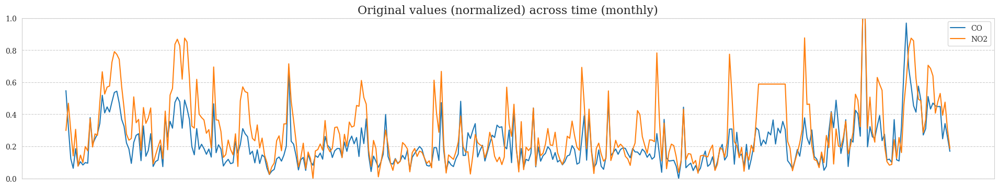

In [ ]:
feature1 = 'CO'
feature2 = 'NO2'
index1 = list_columns.index(feature1)
index2 = list_columns.index(feature2)

ts1 = df_aqi_daily_norm.iloc[:,index1]
ts2 = df_aqi_daily_norm.iloc[:,index2]

print('Distance between {} and {}:'.format(list_columns[index1], list_columns[index2]), round(euclidean(ts1, ts2), 4))

fig, ax = plt.subplots(figsize = (24, 4))
plt.plot(ts1, label = list_columns[index1])
plt.plot(ts2, label = list_columns[index2])
plt.title('Original values (normalized) across time (monthly)')
plt.xticks([])
plt.legend(loc = 'best')
plt.ylim(0, 1)
plt.show()

Distance between CO and NO2: 2.8517


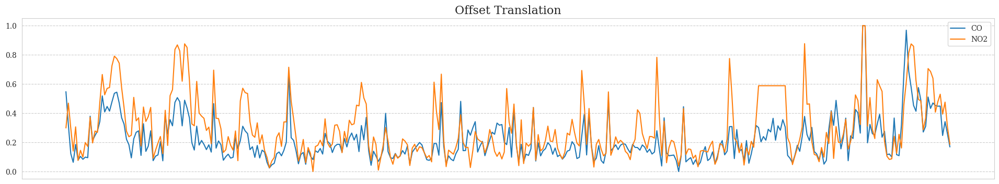

In [ ]:
ts1 = df_aqi_daily_norm.iloc[:,index1]
ts2 = df_aqi_daily_norm.iloc[:,index2]
ts1 = ts1 - ts1.mean()
ts2 = ts2 - ts2.mean()
ts1 = (ts1 - ts1.min()) / (ts1.max() - ts1.min())
ts2 = (ts2 - ts2.min()) / (ts2.max() - ts2.min())

print('Distance between {} and {}:'.format(list_columns[index1], list_columns[index2]), round(euclidean(ts1, ts2), 4))

fig, ax = plt.subplots(figsize = (24, 4))
plt.plot(ts1, label = list_columns[index1])
plt.plot(ts2, label = list_columns[index2])
plt.title('Offset Translation')
plt.xticks([])
plt.legend(loc = 'best')
plt.show()

Distance between CO and NO2: 2.8517


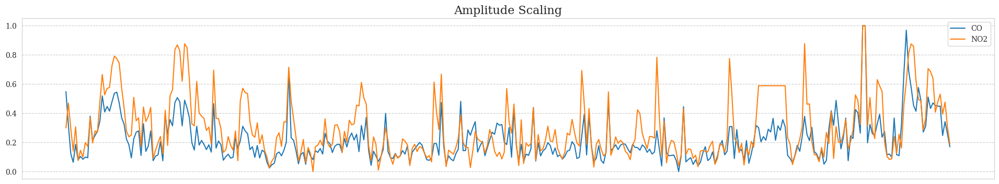

In [ ]:
ts1 = df_aqi_daily_norm.iloc[:,index1]
ts2 = df_aqi_daily_norm.iloc[:,index2]
ts1 = (ts1 - ts1.mean()) / ts1.std()
ts2 = (ts2 - ts2.mean()) / ts2.std()
ts1 = (ts1 - ts1.min()) / (ts1.max() - ts1.min())
ts2 = (ts2 - ts2.min()) / (ts2.max() - ts2.min())

print('Distance between {} and {}:'.format(list_columns[index1], list_columns[index2]), round(euclidean(ts1, ts2), 4))

fig, ax = plt.subplots(figsize = (24, 4))
plt.plot(ts1, label = list_columns[index1])
plt.plot(ts2, label = list_columns[index2])
plt.title('Amplitude Scaling')
plt.xticks([])
plt.legend(loc = 'best')
plt.show()

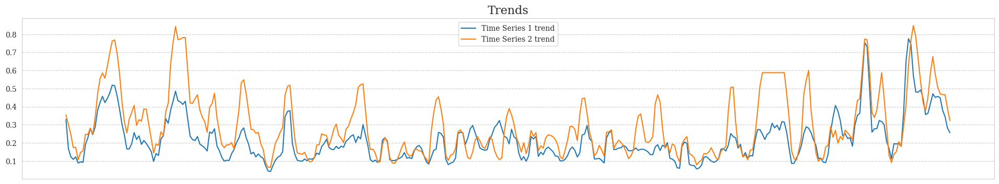

In [ ]:
w = 3
ts1 = df_aqi_daily_norm.iloc[:,index1]
ts2 = df_aqi_daily_norm.iloc[:,index2]

fig, ax = plt.subplots(figsize = (24, 4))
plt.plot(ts1.rolling(window = w).mean(), label = "Time Series 1 trend")
plt.plot(ts2.rolling(window = w).mean(), label = "Time Series 2 trend")
plt.title('Trends')
plt.xticks([])
plt.legend(loc = 'best')
plt.show()

Distance between CO and NO2: 2.2466


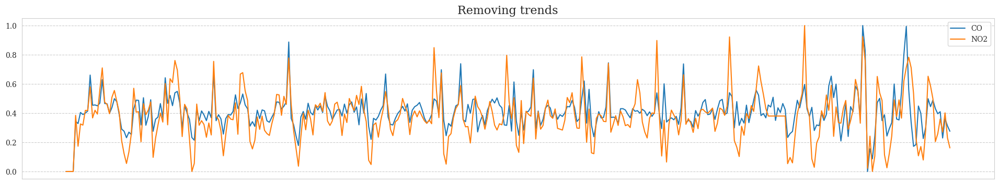

In [ ]:
w = 5
ts1 = df_aqi_daily_norm.iloc[:,index1]
ts2 = df_aqi_daily_norm.iloc[:,index2]
ts1 = ts1 - ts1.rolling(window = w).mean()
ts2 = ts2 - ts2.rolling(window = w).mean()
ts1 = (ts1 - ts1.min()) / (ts1.max() - ts1.min())
ts2 = (ts2 - ts2.min()) / (ts2.max() - ts2.min())

ts1[np.isnan(ts1)] = 0
ts2[np.isnan(ts2)] = 0

print('Distance between {} and {}:'.format(list_columns[index1], list_columns[index2]), round(euclidean(ts1, ts2), 4))

fig, ax = plt.subplots(figsize = (24, 4))
plt.plot(ts1, label = list_columns[index1])
plt.plot(ts2, label = list_columns[index2])
plt.title('Removing trends')
plt.xticks([])
plt.legend(loc = 'best')
plt.show()

Distance between CO and NO2: 2.1188


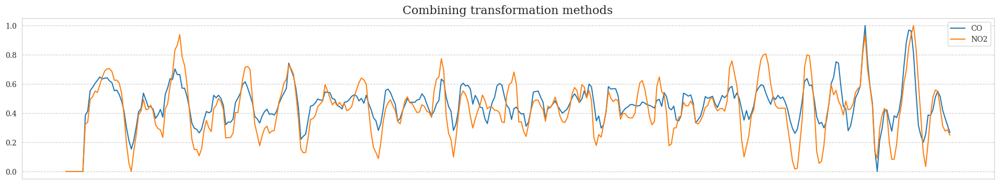

In [ ]:
ts1 = df_aqi_daily_norm.iloc[:,index1]
ts2 = df_aqi_daily_norm.iloc[:,index2]

# Offset translation
ts1 = ts1 - ts1.mean()
ts2 = ts2 - ts2.mean()

# Amplitude Scaling
ts1 = (ts1 - ts1.mean()) / ts1.std()
ts2 = (ts2 - ts2.mean()) / ts2.std()

w = 5
# Removing trends
ts1 = ts1 - (ts1.rolling(window = w).mean())
ts2 = ts2 - (ts2.rolling(window = w).mean())

# Removing noise
ts1 = ((ts1 - ts1.mean()) / ts1.std()).rolling(window = w).mean()
ts2 = ((ts2 - ts2.mean()) / ts2.std()).rolling(window = w).mean()

# Final normalization
ts1 = (ts1 - ts1.min()) / (ts1.max() - ts1.min())
ts2 = (ts2 - ts2.min()) / (ts2.max() - ts2.min())

ts1[np.isnan(ts1)] = 0
ts2[np.isnan(ts2)] = 0

print('Distance between {} and {}:'.format(list_columns[index1], list_columns[index2]), round(euclidean(ts1, ts2), 4))

fig, ax = plt.subplots(figsize = (24, 4))
plt.plot(ts1, label = list_columns[index1])
plt.plot(ts2, label = list_columns[index2])
plt.title('Combining transformation methods')
plt.xticks([])
plt.legend(loc = 'best')
plt.show()